In [9]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import pickle
import os
from scipy import stats

In [10]:
#STEP 1: Which file to visualize network reconstruction

DATASET_ID = "lx108"
state = "UUUT"
frac_cells = 0.2

In [11]:
#STEP 1+: file path way
DATA_FOLDERNAME = "/home/linl5/project/SCLC/data/{}".format(DATASET_ID)
REGULONS_FNAME = os.path.join(DATA_FOLDERNAME, '{}.{}.{}.regulons.p'.format(DATASET_ID, state, frac_cells))
FIGURE_FOLDERNAME = "/home/linl5/project/SCLC/figures/{}".format(DATASET_ID)
REGULON_DF_FILE = os.path.join(DATA_FOLDERNAME, '{}.{}.{}.regulons.csv'.format(DATASET_ID, state, frac_cells))

In [17]:
#Downloaded fromm pySCENIC github repo: https://github.com/aertslab/pySCENIC/tree/master/resources Aug-1-2023
RESOURCES_FOLDERNAME = "/home/linl5/project/SCLC/resources"
HUMAN_TFS_FNAME = os.path.join(RESOURCES_FOLDERNAME, 'allTFs_hg38.txt')

# Read the file into a pandas Series
tf_series = pd.read_csv(HUMAN_TFS_FNAME, header=None)

# Convert the pandas Series to a Python list
tf_full_list = tf_series[0].to_list()

In [12]:
#STEP 2: reading regulon files
with open(REGULONS_FNAME, 'rb') as f:
    regulons = pickle.load(f)

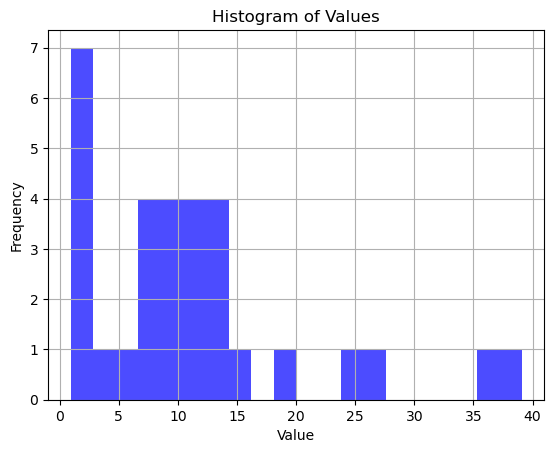

In [13]:


regulons[0]
regulons[0].gene2weight

values = list(regulons[0].gene2weight.values())

# Create a histogram plot
plt.hist(values, bins=20, color='blue', alpha=0.7)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Values')
plt.grid(True)
plt.show()


In [14]:
#STEP 3: converting regulon .p into df
# Initialize an empty list to store the rows of the new DataFrame
rows = []

# Loop through each regulon object in the list
for regulon in regulons:
    regulon_name = regulon.name
    transcription_factor = regulon.transcription_factor
    context = regulon.context
    score = regulon.score
    orthologous_identity = regulon.orthologous_identity
    similarity_qvalue = regulon.similarity_qvalue
    annotation = regulon.annotation
    nes = regulon.nes
    
    #Performing rank normalization: from histogram values appear to be postively skewed for most regulons
    values = list(regulon.gene2weight.values())
    rank_normalized_weight = stats.rankdata(values)/(len(values) + 1)
    count = 0
    # Loop through each gene in the regulon and extract gene-target pairs
    for gene, weight in regulon.gene2weight.items():
        row = {
            'Regulon_Name': regulon_name,
            'Transcription_Factor': transcription_factor,
            'Context': context,
            'Target_Gene': gene,
            'Weight': weight,
            'Scores': score,
            'nes': nes,
            'orthologous_identity': orthologous_identity,
            'similarity_qvalue': similarity_qvalue, 
            'annotation': annotation,
            'Rank_Norm' : rank_normalized_weight[count]
        }
        rows.append(row)
        count += 1

# Create a new DataFrame from the list of rows
regulon_df = pd.DataFrame(rows)
# writing to csv
regulon_df.to_csv(REGULON_DF_FILE, index=False, sep='\t')
print("Successful Reading:", REGULONS_FNAME)
print("Successful Writing:", REGULON_DF_FILE)
# visualizing df
regulon_df.head(5)

Successful Reading: /home/linl5/project/SCLC/data/lx108/lx108.UUUT.0.2.regulons.p
Successful Writing: /home/linl5/project/SCLC/data/lx108/lx108.UUUT.0.2.regulons.csv


,Regulon_Name,Transcription_Factor,Context,Target_Gene,Weight,Scores,nes,orthologous_identity,similarity_qvalue,annotation,Rank_Norm
0,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",HOXB2,11.802446,3.027088,0.0,0.0,0.0,,0.65625
1,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",C12orf42,7.237797,3.027088,0.0,0.0,0.0,,0.31250
2,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",OR51E1,3.430072,3.027088,0.0,0.0,0.0,,0.25000
3,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",PTPN7,1.593558,3.027088,0.0,0.0,0.0,,0.18750
4,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",RAB30,7.625086,3.027088,0.0,0.0,0.0,,0.37500


In [15]:
print(regulon_df["Scores"].unique().tolist())

[3.0270879969890654, 6.229493035091582, 1.5391923271293153, 3.4419831907926524, 7.983870625136969, 4.585953090843294, 3.0349997907691706, 5.229606606907453, 12.561509238130975, 4.772059689970941, 19.73707668457868, 5.356655271663955, 5.668108895900415, 10.354270655040601, 3.39847964450529, 1.5106242818372762, 17.684836061795455, 12.889651481048293, 1.6646216566135126, 13.003541988813996, 14.458308561360932, 3.6655213857251003, 3.073547989191827, 3.516704371143749, 4.139996443546801, 3.2513042456455703, 2.850903537448564, 4.885623080291458, 1.0976101496278599, 1.3095620918214943, 4.854805902976988, 6.2850422625435245, 4.415845874146348, 3.4435986388725097, 1.4663462421262023, 3.2774915570834335, 1.520108529844038, 3.038234267579815, 3.6409424458776183, 3.8950992702916394, 1.5583017585780548, 1.4554288327307912, 1.3696267692388493, 5.6075943183484735, 1.0560000994934933, 1.4291443361788392, 1.0901654786500805, 3.007422634205489, 1.6631616775712597, 3.372810785939369, 1.0617134537620623, 

In [16]:
# STEP 5: List of TFs

print(regulon_df['Transcription_Factor'].unique().tolist())


['ASCL1', 'ATF3', 'ATF5', 'BCL11A', 'BCL3', 'BHLHE40', 'BHLHE41', 'BRCA1', 'CEBPB', 'CEBPD', 'CEBPG', 'CREB5', 'CRX', 'DDIT3', 'DLX5', 'DMRTA1', 'E2F1', 'E2F2', 'E2F5', 'E2F7', 'E2F8', 'EGR1', 'EGR2', 'EGR3', 'EGR4', 'EHF', 'ELF3', 'EPAS1', 'ETS2', 'ETV4', 'FOS', 'FOSB', 'FOSL1', 'FOXC1', 'FOXJ1', 'GATA2', 'GSX1', 'GTF2A1', 'HES5', 'HES6', 'HEY2', 'HMGB1', 'HMGB3', 'HOXA13', 'HOXB2', 'HOXB5', 'HOXD1', 'INSM1', 'IRF1', 'IRX5', 'ISL1', 'JUN', 'JUNB', 'KLF10', 'KLF2', 'KLF3', 'KLF4', 'KLF5', 'KLF6', 'MAFF', 'MESP1', 'MYBL2', 'MYC', 'NFIA', 'NFIB', 'NR2F2', 'PAX6', 'POLE3', 'POU2F2', 'POU3F1', 'POU3F2', 'POU4F1', 'PPARG', 'RAD21', 'RELB', 'RUNX3', 'SIX1', 'SMARCA1', 'SOX2', 'SOX21', 'SOX4', 'SOX9', 'SP5', 'SPIB', 'TBX3', 'YBX1', 'ZSCAN31']


SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx108/lx108.UUUU.FULL_NETWORK.CELL_FRACTION_0.2.png


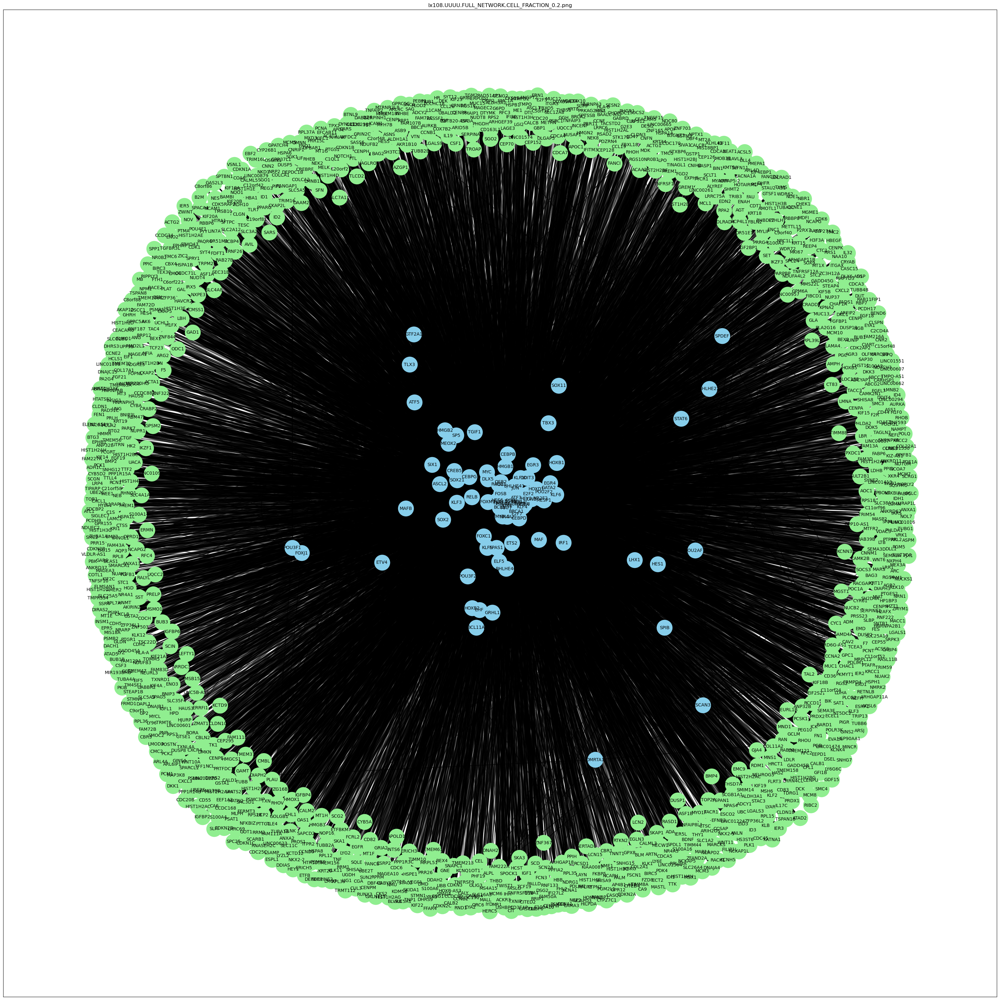

In [58]:
# NETWORK ANALYSIS 1: CREATING FULL NETWORKS BASED ON IMPORTANT TF

# Create a MultiDiGraph for SIGNIFICANT TF
grn = nx.MultiDiGraph()
        
#building nodes     
tg_list = regulon_df['Target_Gene'].unique().tolist()
tf_list = regulon_df['Transcription_Factor'].unique().tolist()

# Add nodes with 'node_type' attribute
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')

# Add directed edges to connect TFs and TGs based on the interactions
for _, row in regulon_df.iterrows():
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Weight']
    grn.add_edge(tf, tg, weight=weight, regulon_name=row['Regulon_Name'])
    
# OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
plt.figure(figsize=(40, 40))
pos = nx.spring_layout(grn, seed = 1)

# Separate TF nodes and TG nodes based on the node_type attribute
tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']

# Draw TF nodes with one color and TG nodes with another color
nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

# Draw edges with weight-based color
nx.draw_networkx_edges(grn, pos, edge_color='black', width=2, alpha=0.6)

# CHANGE !!
TITLE = "{}.{}.FULL_NETWORK.CELL_FRACTION_{}.png".format(DATASET_ID, state, frac_cells)
plt.title(TITLE)

# Draw labels for nodes
labels = {node: node for node in grn.nodes()}
nx.draw_networkx_labels(grn, pos, labels, font_size=10)
plt.show

FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)


In [34]:
# NETWORK ANALYSIS 2: CREATING NETWORKS BASED ON IMPORTANT TF

count = 0

#import in list of important TF
imp_TF = ("NEUROD1", "ASCL1", "POU3F2", "YAP1", "FOXA2", "PLCG2", "NOTCH1")
rows = []

# Loop through each regulon object in the list and subselect for only important tf
for regulon in regulons:
    regulon_name = regulon.name
    transcription_factor = regulon.transcription_factor
    context = regulon.context
    score = regulon.score
    
    #Performing rank normalization: from histogram values appear to be postively skewed for most regulons
    values = list(regulon.gene2weight.values())
    rank_normalized_weight = stats.rankdata(values)/(len(values) + 1)
    count = 0
    # Loop through each gene in the regulon and extract gene-target pairs
    for gene, weight in regulon.gene2weight.items():
        row = {
            'Regulon_Name': regulon_name,
            'Transcription_Factor': transcription_factor,
            'Context': context,
            'Target_Gene': gene,
            'Weight': weight,
            'Scores': score,
            'Rank_Norm' : rank_normalized_weight[count],
        }
        count += 1
        if row['Transcription_Factor'] in imp_TF:
            rows.append(row)
# Create a new DataFrame from the list of rows
sig_regulon_df = pd.DataFrame(rows)
sig_regulon_df
#print(DATASET_ID, state, frac_cells, "has following significant TF:", sig_regulon_df['Transcription_Factor'].unique().tolist())

,Regulon_Name,Transcription_Factor,Context,Target_Gene,Weight,Scores,Rank_Norm
0,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",HOXB2,11.802446,3.027088,0.65625
1,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",C12orf42,7.237797,3.027088,0.31250
2,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",OR51E1,3.430072,3.027088,0.25000
3,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",PTPN7,1.593558,3.027088,0.18750
4,ASCL1(+),ASCL1,"(jaspar__MA0499.1.png, activating)",RAB30,7.625086,3.027088,0.37500
...,...,...,...,...,...,...,...
75,POU3F2(+),POU3F2,"(flyfactorsurvey__vvl_FlyReg_FBgn0086680.png, ...",DNAJB1,2.526041,1.757103,0.42000
76,POU3F2(+),POU3F2,"(flyfactorsurvey__vvl_FlyReg_FBgn0086680.png, ...",RELB,1.907006,1.757103,0.26000
77,POU3F2(+),POU3F2,"(flyfactorsurvey__vvl_FlyReg_FBgn0086680.png, ...",NEURL3,1.123551,1.757103,0.04000
78,POU3F2(+),POU3F2,"(flyfactorsurvey__vvl_FlyReg_FBgn0086680.png, ...",LCN2,1.176938,1.757103,0.10000


SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx108/lx108.UUUT.IMPORTANT_TF.CELL_FRACTION_0.2.aligned.png


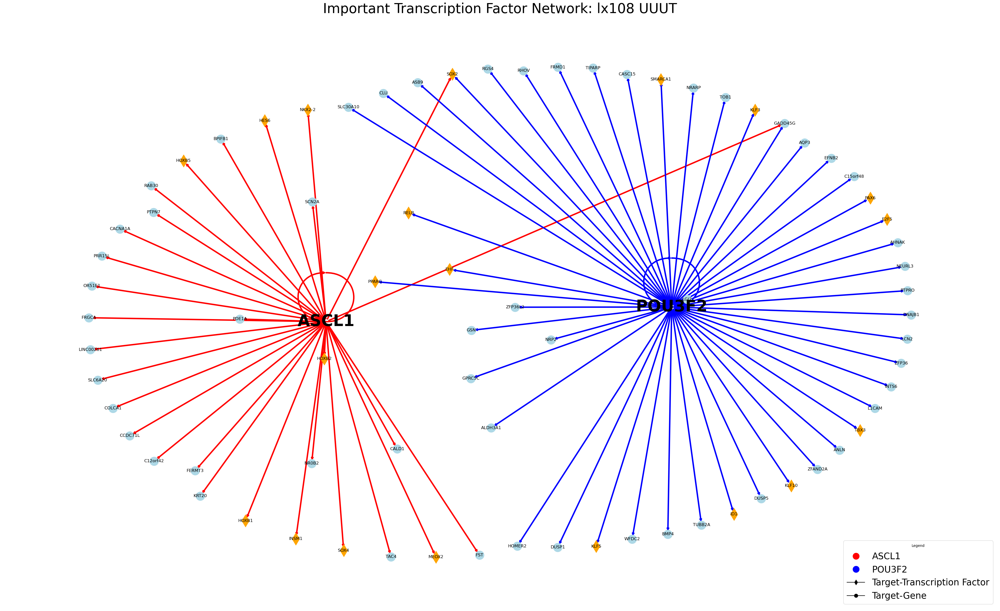

In [223]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import random
import numpy as np
import matplotlib.patches as patches

# Opening graph
grn = nx.MultiDiGraph()


#building nodes     
tg_list = sig_regulon_df['Target_Gene'].unique().tolist()
tf_list = sig_regulon_df['Transcription_Factor'].unique().tolist()
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')


# Create a dictionary to hold subgraphs for each regulon_name
regulon_subgraphs = {}

# Iterate through the DataFrame and add nodes and edges to the subgraphs
for _, row in sig_regulon_df.iterrows():
    regulon_name = row['Regulon_Name']
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Rank_Norm']
    
    # Check if the regulon subgraph already exists, if not, create it
    if regulon_name not in regulon_subgraphs:
        regulon_subgraphs[regulon_name] = nx.MultiDiGraph()
    
    # Add nodes and edges to the subgraph
    regulon_subgraphs[regulon_name].add_edge(tf, tg, weight=weight, regulon_name=regulon_name)

# Combine the subgraphs into a single graph
combined_graph = nx.MultiDiGraph()
for subgraph in regulon_subgraphs.values():
    combined_graph = nx.compose(combined_graph, subgraph)

# Create a layout where subgraphs are positioned separately

# Calculate the angle between each subgraph based on the number of subgraphs

num_subgraphs = len(regulon_subgraphs)
angle_between_subgraphs = 5 * np.pi / num_subgraphs # Adjust this value as needed !!!

# Create a dictionary to hold the positions of subgraphs
subgraph_positions = {}

# Define the scale_factor and seperation factor
sep_factor = 25 #Adjust this value as needed !!!
scale_factor = 2.5  # Adjust this value as needed !!!

# Iterate through the subgraphs and calculate positions on a circle
for idx, (regulon_name, subgraph) in enumerate(regulon_subgraphs.items()):
    angle = idx * angle_between_subgraphs
    x = np.cos(angle) * scale_factor
    y = np.sin(angle) * scale_factor
    subgraph_positions[regulon_name] = (x + random.randint(3,sep_factor), y) #adjust!!!

# Create a dictionary to hold the positions of nodes in the combined graph -> sec
pos = {}

# Iterate through each subgraph and update positions for nodes
for regulon_name, subgraph in regulon_subgraphs.items():
    subgraph_pos = nx.spring_layout(subgraph, seed=42)
    
    # Scale the positions of nodes in the subgraph
    for node, coords in subgraph_pos.items():
        scaled_x = coords[0] * scale_factor + subgraph_positions[regulon_name][0]
        scaled_y = coords[1] * scale_factor + subgraph_positions[regulon_name][1]
        subgraph_pos[node] = (scaled_x, scaled_y)
    
    # Update the positions dictionary with the scaled positions
    pos.update(subgraph_pos)

    
###
# Calculate the combined layout by averaging node positions
combined_layout = nx.spring_layout(combined_graph, pos=pos, seed=42)

# List of colors for edge colors
color_list = ['red', 'blue', 'green', 'purple', 'orange', 'pink', 'brown', 'gray']

# Create a dictionary to map regulon names to unique edge colors
tf_edge_colors = {tf_name: random.choice(color_list) for tf_name in tf_list}


# Draw edges with unique colors for each regulon
# Iterate through edges and assign colors based on transcription factors
edge_colors = []

for u, v, data in combined_graph.edges(data=True):
    edge_color = tf_edge_colors[u]
    edge_colors.append(edge_color)

# Drawing the graph
plt.figure(figsize=(50, 30))
plt.rcParams['axes.facecolor'] = 'white'

#Title
plt.title("Important Transcription Factor Network: {} {}".format(DATASET_ID, state), fontsize=38)

# Adding a legend for regulon names and edge colors
legend_labels = {regulon_name: edge_color for regulon_name, edge_color in tf_edge_colors.items()}
# edge color legend
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=20, markerfacecolor=color) for label, color in legend_labels.items()]

# Add custom legend handles for node shapes and labels
shape_legend_handles = [
    plt.Line2D([0], [0], marker=shape, color='black', label=shape_label, markersize=10)
    for shape, shape_label in [('d', 'Target-Transcription Factor'), ('o', 'Target-Gene')]
]

# Combine legend handles
all_legend_handles = legend_handles + shape_legend_handles
plt.legend(handles=all_legend_handles, title='Legend', loc='lower right', prop={'size': 25})


# Add node labels with different font sizes for TFs and TGs
tf_labels = {node: node for node in combined_graph.nodes() if grn.nodes[node]['node_type'] == 'TF'}
tg_labels = {node: node for node in combined_graph.nodes() if grn.nodes[node]['node_type'] == 'TG'}

# Draw nodes and edges
nx.draw_networkx_nodes(combined_graph, combined_layout, node_color='lightblue', node_size=0)
nx.draw_networkx_edges(combined_graph, combined_layout, edge_color=edge_colors, width=4.0, alpha=1)
node_shapes = {node: 'square' if node in tf_full_list else 'circle' for node in tg_labels}
nx.draw_networkx_nodes(combined_graph, combined_layout, nodelist=[node for node in tg_labels if node in tf_full_list], node_shape='d', node_color='orange', node_size=600)
nx.draw_networkx_nodes(combined_graph, combined_layout, nodelist=[node for node in tg_labels if node not in tf_full_list], node_shape='o', node_color='lightblue', node_size=600)

# Draw TF labels with larger font size
nx.draw_networkx_labels(combined_graph, combined_layout, labels=tf_labels, font_size=45, font_weight='bold')  # Adjust the font size for TFs

# Draw TG labels with smaller font size
nx.draw_networkx_labels(combined_graph, combined_layout, labels=tg_labels, font_size=12)  # Adjust the font size for TGs

plt.axis('off')
FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, "Important TF Network_{}_{}_{}.png".format(DATASET_ID, state, frac_cells))
plt.savefig(FIGURE_NAME, bbox_inches='tight', dpi=300)
FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)
plt.show()


SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx108/lx108.UUUT.IMPORTANT_TF.CELL_FRACTION_0.2.aligned.png


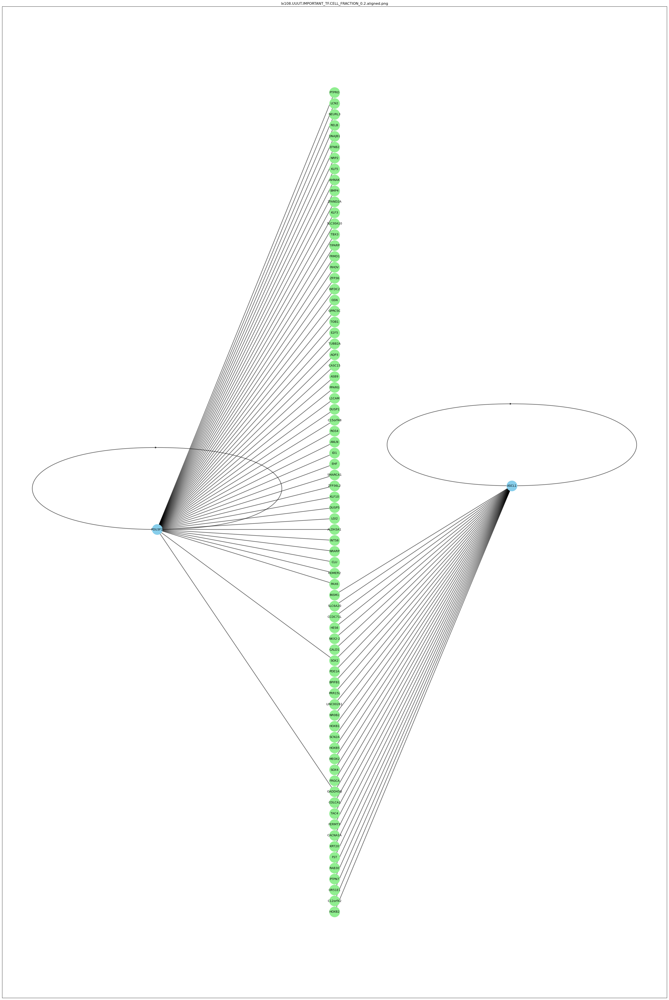

In [220]:
# Create a MultiDiGraph for SIGNIFICANT TF: ALIGNED
import random
grn = nx.MultiDiGraph()
        
#building nodes     
tg_list = sig_regulon_df['Target_Gene'].unique().tolist()
tf_list = sig_regulon_df['Transcription_Factor'].unique().tolist()
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')

# Add directed edges to connect TFs and TGs based on the interactions
for _, row in sig_regulon_df.iterrows():
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Weight']
    grn.add_edge(tf, tg, weight=weight, regulon_name=row['Regulon_Name'])
    
# OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
plt.figure(figsize=(40, 60))

# Create positions for TG nodes in the middle
tg_positions = {node: (0, i) for i, node in enumerate(tg_nodes)}

# Create positions for TF nodes on the right and left sides
position = -1
tf_positions = {
    node: ((position ** i) * 4, random.randint(1, 40)) 
    for i, node in enumerate(tf_nodes)
}

# Combine the positions
pos = {**tg_positions, **tf_positions}

# Separate TF nodes and TG nodes based on the node_type attribute
tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']

# Draw TF nodes with one color and TG nodes with another color
nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

# Draw edges with weight-based color
nx.draw_networkx_edges(grn, pos, edge_color='black', width=2, alpha=0.6)

# CHANGE !!
TITLE = "{}.{}.IMPORTANT_TF.CELL_FRACTION_{}.aligned.png".format(DATASET_ID, state, frac_cells)
plt.title(TITLE)

# Draw labels for nodes
labels = {node: node for node in grn.nodes()}
nx.draw_networkx_labels(grn, pos, labels, font_size=10)
plt.show

FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)


SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx108/lx108.UUUU.IMPORTANT_TF.CELL_FRACTION_0.2.random.png


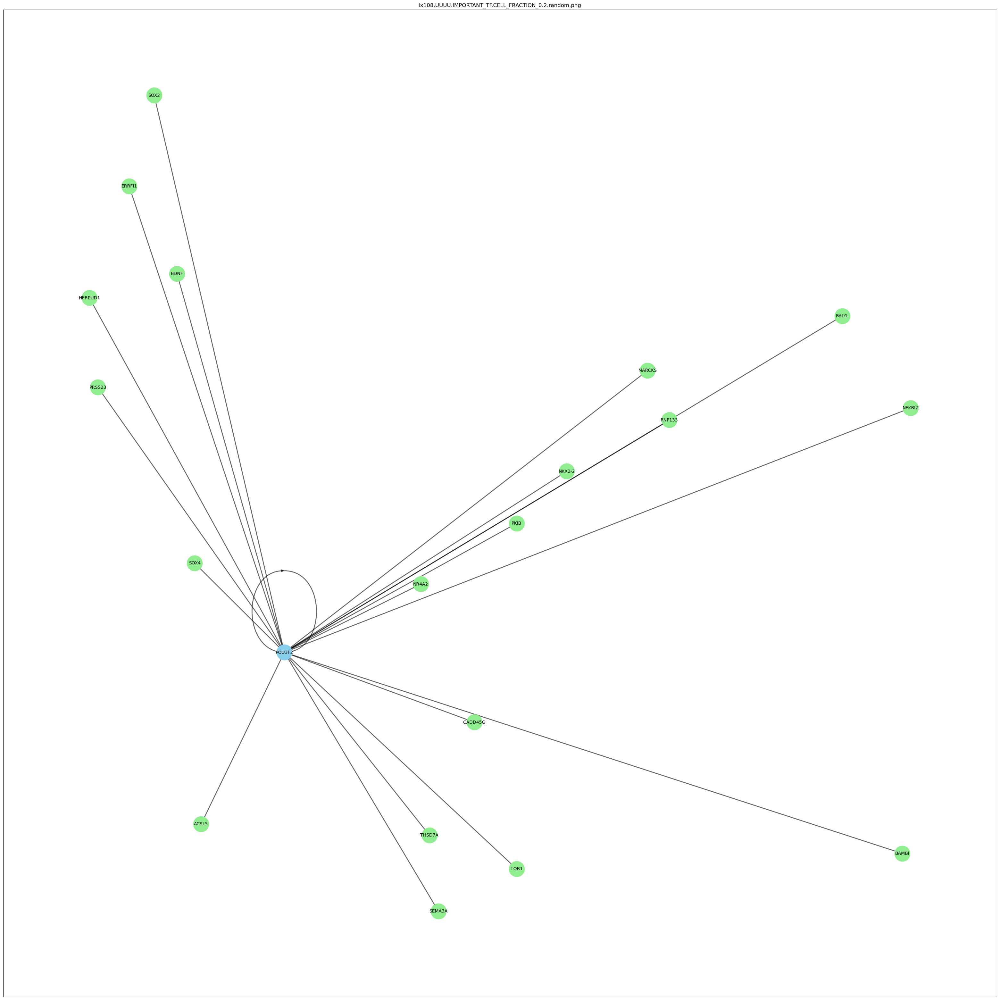

In [62]:
# Create a MultiDiGraph for SIGNIFICANT TF: RANDOM LAYOUT
grn = nx.MultiDiGraph()
        
#building nodes     
tg_list = []
tf_list = []

tf_list = sig_regulon_df['Transcription_Factor'].unique().tolist()
tg_list = sig_regulon_df['Target_Gene'].unique().tolist()
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')

# Add directed edges to connect TFs and TGs based on the interactions
for _, row in sig_regulon_df.iterrows():
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Weight']
    grn.add_edge(tf, tg, weight=weight, regulon_name=row['Regulon_Name'])
    
# OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
plt.figure(figsize=(40, 40))
pos = nx.random_layout(grn, seed = 2)

# Separate TF nodes and TG nodes based on the node_type attribute
tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']

# Draw TF nodes with one color and TG nodes with another color
nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

# Draw edges with weight-based color
nx.draw_networkx_edges(grn, pos, edge_color='black', width=2, alpha=0.6)

# CHANGE !!
TITLE = "{}.{}.IMPORTANT_TF.CELL_FRACTION_{}.random.png".format(DATASET_ID, state, frac_cells)
plt.title(TITLE)

# Draw labels for nodes
labels = {node: node for node in grn.nodes()}
nx.draw_networkx_labels(grn, pos, labels, font_size=10)
plt.show

FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)


SUCCESSFULLY WRITTEN: /home/linl5/project/SCLC/figures/lx108/lx108.UTTU.IMPORTANT_TF.CELL_FRACTION_0.2.random.png


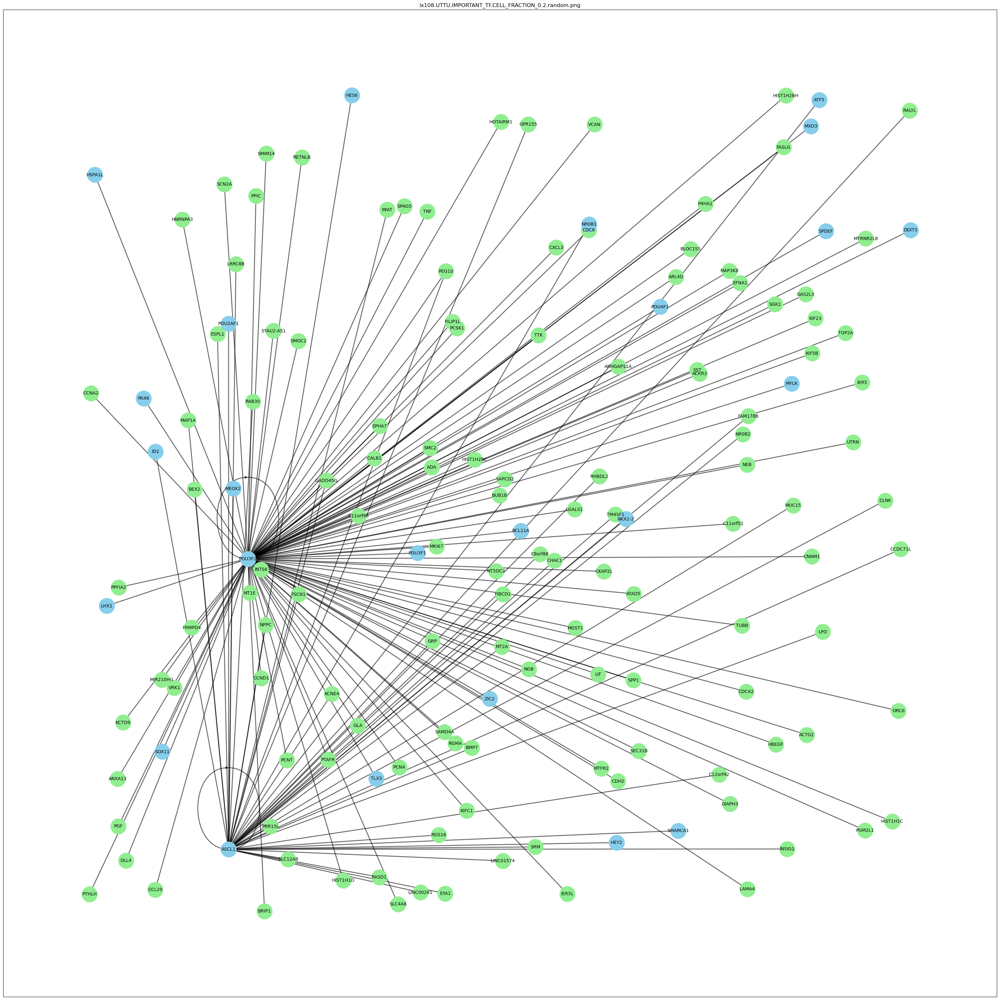

In [279]:
# Create a MultiDiGraph for SIGNIFICANT TF (WITH TARGET_TF being a different color)
grn = nx.MultiDiGraph()
        
#building nodes     
tg_list = []
tf_list = []

tf_list = sig_regulon_df['Transcription_Factor'].unique().tolist()

for genes in sig_regulon_df['Target_Gene'].unique().tolist():
    if genes in tf_full_list:
        tf_list.append(genes)
    else:
        tg_list.append(genes)
grn.add_nodes_from(tg_list, node_type='TG')
grn.add_nodes_from(tf_list, node_type='TF')

# Add directed edges to connect TFs and TGs based on the interactions
for _, row in sig_regulon_df.iterrows():
    tf = row['Transcription_Factor']
    tg = row['Target_Gene']
    weight = row['Weight']
    grn.add_edge(tf, tg, weight=weight, regulon_name=row['Regulon_Name'])
    
# OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
plt.figure(figsize=(40, 40))
pos = nx.random_layout(grn, seed = 2)

# Separate TF nodes and TG nodes based on the node_type attribute
tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']

# Draw TF nodes with one color and TG nodes with another color
nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

# Draw edges with weight-based color
nx.draw_networkx_edges(grn, pos, edge_color='black', width=2, alpha=0.6)

# CHANGE !!
TITLE = "{}.{}.IMPORTANT_TF.CELL_FRACTION_{}.random.png".format(DATASET_ID, state, frac_cells)
plt.title(TITLE)

# Draw labels for nodes
labels = {node: node for node in grn.nodes()}
nx.draw_networkx_labels(grn, pos, labels, font_size=10)
plt.show

FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
plt.savefig(FIGURE_NAME)
print("SUCCESSFULLY WRITTEN:", FIGURE_NAME)


In [2]:
# METHOD DEFINING FOR NETWORK ANALYSIS 3


# @input: the file path to the regulon.p file for the specific dataset, state, and cell fraction
# @output: the dataframe object with all the needed information from regulon.p file with added rank normalization info for each genes by regulons
# this method converts regulon .p information to a dataframe for better handling and reading while also doing rank normalization for all the genes in each regulons
def Regulon_read(REGULONS_FNAME):
    #Reading file
    with open(REGULONS_FNAME, 'rb') as f:
        regulons = pickle.load(f)
    print("SUCCESSFUL READING OF:", REGULONS_FNAME)
    
    # Initialize an empty list to store the rows of the new DataFrame
    rows = []

    # Loop through each regulon object in the list
    for regulon in regulons:
        regulon_name = regulon.name
        transcription_factor = regulon.transcription_factor
        context = regulon.context
        score = regulon.score
        orthologous_identity = regulon.orthologous_identity
        similarity_qvalue = regulon.similarity_qvalue
        annotation = regulon.annotation
        nes = regulon.nes

        #Performing rank normalization: from histogram values appear to be postively skewed for most regulons
        values = list(regulon.gene2weight.values())
        rank_normalized_weight = stats.rankdata(values)/(len(values) + 1)
        count = 0
        # Loop through each gene in the regulon and extract gene-target pairs
        for gene, weight in regulon.gene2weight.items():
            row = {
                'Regulon_Name': regulon_name,
                'Transcription_Factor': transcription_factor,
                'Context': context,
                'Target_Gene': gene,
                'Weight': weight,
                'Scores': score,
                'nes': nes,
                'orthologous_identity': orthologous_identity,
                'similarity_qvalue': similarity_qvalue, 
                'annotation': annotation,
                'Rank_Norm' : rank_normalized_weight[count]
            }
            rows.append(row)
            count += 1

    # Create a new DataFrame from the list of rows
    regulon_df = pd.DataFrame(rows)
    return regulon_df

# @input: regulon dataframe
# @output: networkx object of gene regulatory networkx built from the regulon dataframe
# this method takes in the information from the regulon dataframe and starts assembling the nodes and edges in the regulons dataframe

def GRN_build(regulon_df):
    grn = nx.MultiDiGraph()
    #building nodes     
    tg_list = regulon_df['Target_Gene'].unique().tolist()
    tf_list = regulon_df['Transcription_Factor'].unique().tolist()
    grn.add_nodes_from(tg_list, node_type='TG')
    grn.add_nodes_from(tf_list, node_type='TF')

    # Add directed edges to connect TFs and TGs based on the interactions
    for _, row in regulon_df.iterrows():
        tf = row['Transcription_Factor']
        tg = row['Target_Gene']
        weight = row['Weight']
        rank = row['Rank_Norm']
        grn.add_edge(tf, tg, weight=weight, rank=rank, regulon_name=row['Regulon_Name'])
    return grn

# @input: networkx gene regulatory network object with additional labeling for titles about dataset, state, fraction cell for both files that are being compared
# visualize out networks
def Network_visualizing(grn, DATASET_ID1, state1, frac_cells1, DATASET_ID2, state2, frac_cells2, Threshould):
    # OPTIONS: Rrandom_layout, spring_layout, or kamada_kawai_layout
    plt.figure(figsize=(40, 40))

    # Separate TF nodes and TG nodes based on the node_type attribute
    tf_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TF']
    tg_nodes = [node for node in grn.nodes() if grn.nodes[node]['node_type'] == 'TG']
    
    # Create positions for TG nodes in the middle
    tg_positions = {node: (0, i) for i, node in enumerate(tg_nodes)}

    # Create positions for TF nodes on the right and left sides
    position = -1
    tf_positions = {
        node: ((position ** i) * random.uniform(2, 4), random.randint(1, 40)) 
        for i, node in enumerate(tf_nodes)
    }

    # Combine the positions
    pos = {**tg_positions, **tf_positions}

    # Draw TF nodes with one color and TG nodes with another color
    nx.draw_networkx_nodes(grn, pos, nodelist=tg_nodes, node_color='lightgreen', node_size=1200)
    nx.draw_networkx_nodes(grn, pos, nodelist=tf_nodes, node_color='skyblue', node_size=1200)

    # Draw edges with weight-based color and enhanced arrowheads
    nx.draw_networkx_edges(
        grn,
        pos,
        edge_color='black',
        width=2,
        alpha=0.6,
        arrowstyle='->',   # Enhance arrow style
        arrowsize=30       # Enhance arrow size
    )

    # CHANGE !!
    TITLE = "MainGraphDATA:{}.{}.{}_COMPARE_TO.{}.{}.{}.Threshould:{}.png".format(DATASET_ID1, state1, frac_cells1, DATASET_ID2, state2, frac_cells2, Threshould)
    plt.title(TITLE)

    # Draw labels for nodes
    labels = {node: node for node in grn.nodes()}
    nx.draw_networkx_labels(grn, pos, labels, font_size=10)
    
    FIGURE_FOLDERNAME = "/home/linl5/project/SCLC/figures/{}".format(DATASET_ID1)
    FIGURE_NAME = os.path.join(FIGURE_FOLDERNAME, TITLE)
    plt.savefig(FIGURE_NAME)
    print("\nSUCCESSFUL WRITING", FIGURE_NAME, "\n")
    
    plt.show()

# @input: networkx grn object, and a numerical threshould to determine what top percentage of tf-tg interaction to conserve in the regulon
# output: the post normalized and process by threshould networkx grn
def Removing_Rank(grn, threshould):
    rm_rank_edges = set()
    for source, target, attributes in grn.edges(data=True):
        if 'rank' in attributes:
            rank_value = attributes['rank']
            if rank_value < threshould:
                rm_rank_edges.add((source, target))
    grn.remove_edges_from(rm_rank_edges)
    return grn
# @input: networkx grn object, 
# output: the post grn after removing nodes with no edges 
def isolated_nodes(grn):
    isolated_nodes = list(nx.isolates(grn))
    grn.remove_nodes_from(isolated_nodes)
    return grn

SUCCESSFUL READING OF: /home/linl5/project/SCLC/data/lx108/lx108.UUUU.0.2.regulons.p
SUCCESSFUL READING OF: /home/linl5/project/SCLC/data/lx108/lx108.UTTU.0.2.regulons.p

lx108.UUUU.0.2.regulons interactions: (11826, 11)
lx108.UTTU.0.2.regulons interactions: (11608, 11)

lx108.UUUU.0.2.regulons nodes: 1484
lx108.UTTU.0.2.regulons nodes: 1478

There are 5269 shared interactions among lx108.UTTU.0.2.regulons and lx108.UUUU.0.2.regulons
Unique edges in lx108.UUUU.0.2.regulons: 6557
Unique edges in lx108.UTTU.0.2.regulons: 6339
Second check for shared edges: expect zero after removal: 0

Threshould 0 : Edges left in lx108.UUUU.0.2.regulons: 6557
Threshould 0 : Edges left in lx108.UTTU.0.2.regulons: 6339

lx108.UUUU.0.2.regulons nodes left: 1452
lx108.UTTU.0.2.regulons nodes left: 1419

SUCCESSFUL WRITING /home/linl5/project/SCLC/figures/lx108/MainGraphDATA:lx108.UUUU.0.2_COMPARE_TO.lx108.UTTU.0.2.Threshould:0.png 



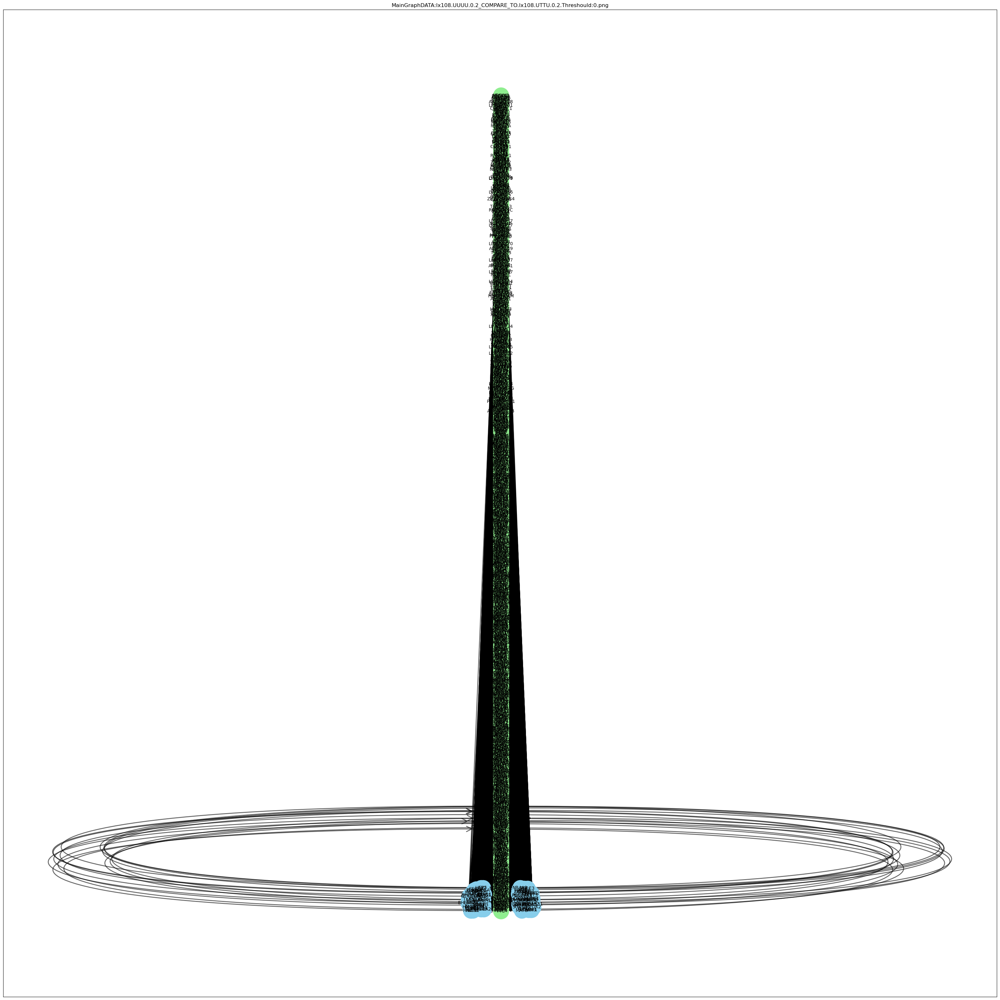


SUCCESSFUL WRITING /home/linl5/project/SCLC/figures/lx108/MainGraphDATA:lx108.UTTU.0.2_COMPARE_TO.lx108.UUUU.0.2.Threshould:0.png 



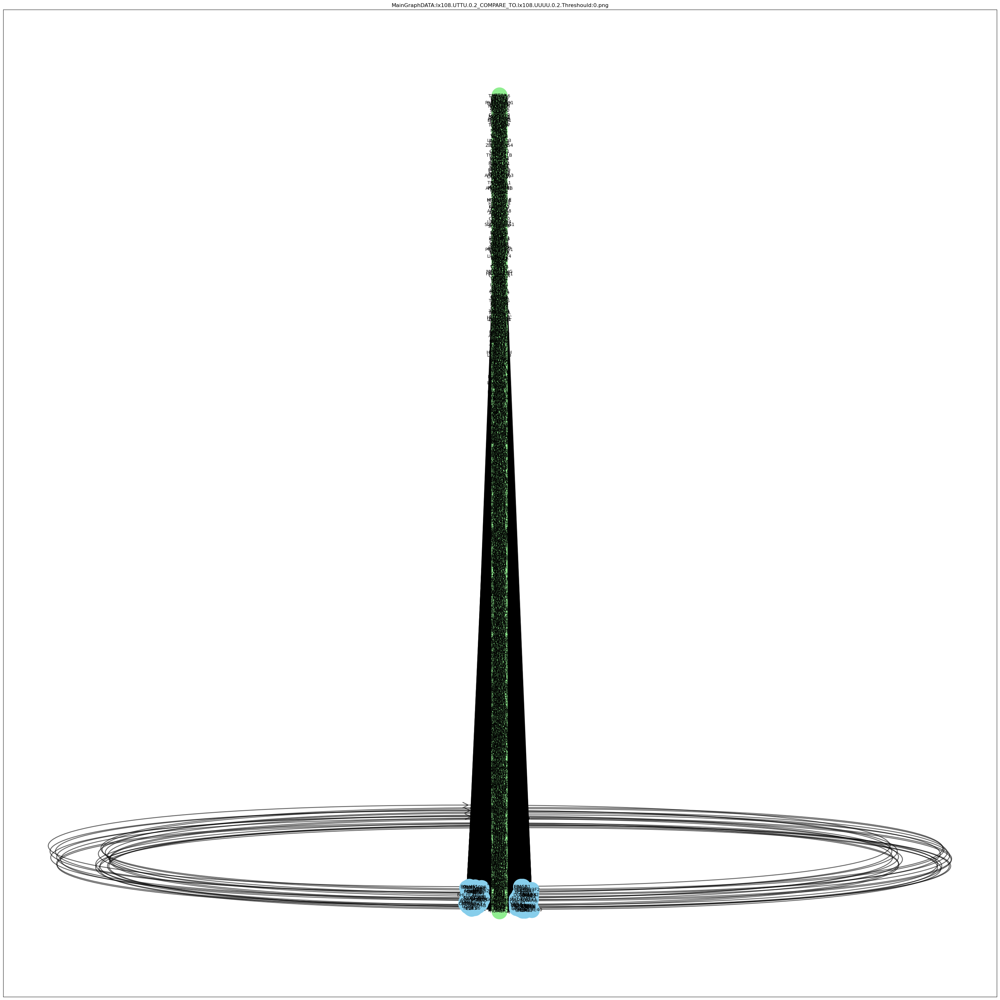

In [15]:
#NETWORK ANALYSIS 3: CREATING NETWORKS BASED ON COMPARING 2 NETWORKS AND ISOLATING UNIQUE ONES ONLY

import os
import numpy as np
from scipy import stats
import random

#FILE 1 defining
DATASET_ID1 = "lx108"
state1 = "UUUU"
frac_cells1 = 0.2
DATA_FOLDERNAME = "/home/linl5/project/SCLC/data/{}".format(DATASET_ID1)
REGULONS_FNAME = os.path.join(DATA_FOLDERNAME, '{}.{}.{}.regulons.p'.format(DATASET_ID1, state1, frac_cells1))

#File 1 regulon df
regulon1 = Regulon_read(REGULONS_FNAME)

#FILE 2 defining
DATASET_ID2 = "lx108"
state2 = "UTTU"
frac_cells2 = 0.2
DATA_FOLDERNAME = "/home/linl5/project/SCLC/data/{}".format(DATASET_ID2)
REGULONS_FNAME = os.path.join(DATA_FOLDERNAME, '{}.{}.{}.regulons.p'.format(DATASET_ID2, state2, frac_cells2))

#File 2 regulon df
regulon2 = Regulon_read(REGULONS_FNAME)

#Printing out total interactions TF-TG in both files pre-shared processing
print('\n{}.{}.{}.regulons interactions:'.format(DATASET_ID1, state1, frac_cells1), regulon1.shape)
print('{}.{}.{}.regulons interactions:'.format(DATASET_ID2, state2, frac_cells2), regulon2.shape)

#GRN building
grn1 = GRN_build(regulon1)
grn2 = GRN_build(regulon2)
print('\n{}.{}.{}.regulons nodes:'.format(DATASET_ID1, state1, frac_cells1), grn1.number_of_nodes())
print('{}.{}.{}.regulons nodes:'.format(DATASET_ID2, state2, frac_cells2), grn2.number_of_nodes())

#finding common edges
common_edges = set(grn1.edges()) & set(grn2.edges())
print("\nThere are", len(common_edges), "shared interactions among", '{}.{}.{}.regulons'.format(DATASET_ID2, state2, frac_cells2), 'and {}.{}.{}.regulons'.format(DATASET_ID1, state1, frac_cells1))

#deleting out common edges
grn1.remove_edges_from(common_edges)
print('Unique edges in {}.{}.{}.regulons:'.format(DATASET_ID1, state1, frac_cells1), len(grn1.edges()))
grn2.remove_edges_from(common_edges)
print('Unique edges in {}.{}.{}.regulons:'.format(DATASET_ID2, state2, frac_cells2), len(grn2.edges()))

#check
testcommon_edges = set(grn1.edges()) & set(grn2.edges())
print("Second check for shared edges: expect zero after removal:", len(testcommon_edges))

#Results show still a lot of interactions after removal of common -> will need to normalize and isolate to find significant ones
#Made histrogram -> shows that most data isn't gaussian distribution visually, not normally distributed, seems postively skewed -> decided rank appraoch might be best while account for the size of the genes in regulon so no over representation of smaller regulons

# Setting threshould to isolate significant tf-tg interaction based on rank normalized threshould
Threshould = 0
grn1 = Removing_Rank(grn1, Threshould)
print("\nThreshould", Threshould, ': Edges left in {}.{}.{}.regulons:'.format(DATASET_ID1, state1, frac_cells1), len(grn1.edges()))
grn2 = Removing_Rank(grn2, Threshould)
print("Threshould", Threshould, ': Edges left in {}.{}.{}.regulons:'.format(DATASET_ID2, state2, frac_cells2), len(grn2.edges()))

#removing about nodes with no edges after removing shared edges and rank edges according to threshould
grn1 = isolated_nodes(grn1)
grn2 = isolated_nodes(grn2)

print('\n{}.{}.{}.regulons nodes left:'.format(DATASET_ID1, state1, frac_cells1), grn1.number_of_nodes())
print('{}.{}.{}.regulons nodes left:'.format(DATASET_ID2, state2, frac_cells2), grn2.number_of_nodes())

#ploting
Network_visualizing(grn1, DATASET_ID1, state1, frac_cells1, DATASET_ID2, state2, frac_cells2, Threshould)
Network_visualizing(grn2, DATASET_ID2, state2, frac_cells2, DATASET_ID1, state1, frac_cells1, Threshould)
